In [244]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# import ipywidgets as widgets
# import ipywidgets as widgets
import matplotlib.dates as mdates
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import plotly.io as pio
import math

from plotly.subplots import make_subplots
# from IPython.display import display
from matplotlib.widgets import Slider
# from IPython.display import display

In [2]:
data = pd.read_csv('merged_df.csv')

In [3]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81855 entries, 0 to 81854
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        81855 non-null  int64  
 1   item_id           81855 non-null  object 
 2   store_id          81855 non-null  object 
 3   date_id           81855 non-null  float64
 4   cnt               81855 non-null  float64
 5   date              81855 non-null  object 
 6   wm_yr_wk          81855 non-null  int64  
 7   wday              81855 non-null  int64  
 8   month             81855 non-null  int64  
 9   year              81855 non-null  int64  
 10  event_name_1      81855 non-null  object 
 11  event_type_1      81855 non-null  object 
 12  event_name_2      81855 non-null  object 
 13  event_type_2      81855 non-null  object 
 14  cashback_store_1  81855 non-null  float64
 15  cashback_store_2  81855 non-null  float64
 16  cashback_store_3  81855 non-null  float6

## 1. Количество продаж товара

In [4]:
def sales_pipeline_count_sales(dates, sales):
    """
    Принимает два списка: даты и количество продаж.
    
    Вход:
    - dates: Список с датами (должен быть тип np.array или list).
    - sales: Список с количеством продаж (должен быть тип np.array или list).
    
    Выход:
    - Возвращает массив дат и продаж для построения графика, фильтрованные по последним 100 записям.
    """
    
    if not isinstance(dates, (list, np.ndarray)) or not isinstance(sales, (list, np.ndarray)):
        raise ValueError("На вход должны подаваться списки или массивы.")
    
    # Преобразуем списки в numpy массивы для удобства
    dates = pd.to_datetime(np.array(dates))  # Преобразуем даты в формат datetime
    sales = np.array(sales)
    
    # Фильтруем последние 100 записей по дате
    filtered_dates = dates[-100:]
    filtered_sales = sales[-100:]
    
    return filtered_dates, filtered_sales

### 1.1 Линейный график

In [5]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [6]:
def plot_sales_count_sales(dates, sales):
    """
    Строит интерактивный график количества продаж по указанным датам с использованием plotly.io.
    
    Вход:
    - dates: Массив с датами.
    - sales: Массив с количеством продаж.
    """
    
    fig = go.Figure()
    
    # Добавляем данные на график
    fig.add_trace(go.Bar(
        x=dates,
        y=sales,
        marker_color='blue',
        name='Количество продаж'
    ))
    
    # Настраиваем внешний вид графика
    fig.update_layout(
        title="Количество продаж за указанный период",
        xaxis_title="Дата",
        yaxis_title="Количество продаж",
        xaxis_tickformat='%b %d, %Y',
        xaxis_tickangle=-45,
        template="plotly_white"  # Изменение темы на светлую
    )
    
    # Показать график
    fig.show()

In [7]:
# Применение пайплайна для получения последних 100 записей
processed_dates, processed_sales = sales_pipeline_count_sales(dates_list, sales_list)

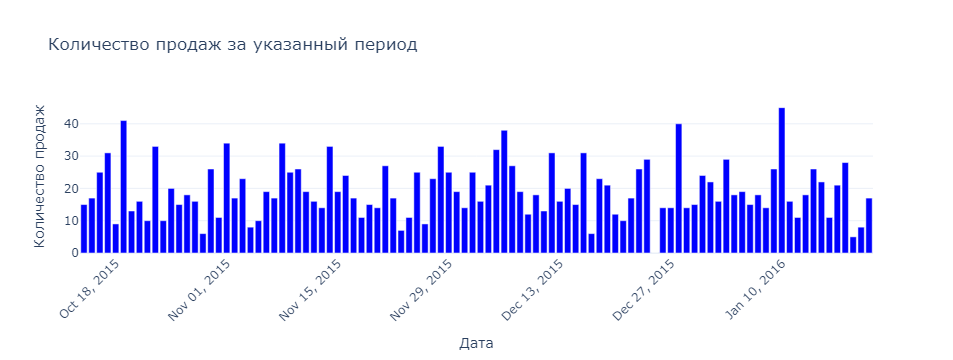

In [8]:
# Построение графика с использованием обработанных данных
plot_sales_count_sales(processed_dates, processed_sales)

## 2. Рост или падение продаж в сравнении с предыдущим периодом (в %)

In [9]:
def sales_pipeline_change_compared_prev_period(dates, sales):
    """
    Принимает два списка: даты и количество продаж.
    
    Вход:
    - dates: Список с датами (должен быть тип np.array или list).
    - sales: Список с количеством продаж (должен быть тип np.array или list).
    
    Выход:
    - Возвращает массив дат и продаж для построения графика, фильтрованные по последним 100 записям.
    """
    
    if not isinstance(dates, (list, np.ndarray)) or not isinstance(sales, (list, np.ndarray)):
        raise ValueError("На вход должны подаваться списки или массивы.")
    
    # Преобразуем списки в numpy массивы для удобства
    dates = pd.to_datetime(np.array(dates))  # Преобразуем даты в формат datetime
    sales = np.array(sales)
    
    # Фильтруем последние 100 записей по дате
    filtered_dates = dates[-100:]
    filtered_sales = sales[-100:]
    
    return filtered_dates, filtered_sales

### - 2.0 Динамический график скользящего среднего (без подписей) 

In [10]:
def plot_sales_change_compared_prev_period(dates, sales_change):
    """    
    Вход:
    - dates: Массив с датами.
    - sales_change: Массив с процентным изменением продаж.
    """
    
    fig = go.Figure()
    
    # Добавляем данные на график
    fig.add_trace(go.Scatter(
        x=dates,
        y=sales_change,
        mode='lines+markers',
        marker=dict(color='green', size=8),
        line=dict(color='green'),
        name='Изменение продаж (%)'
    ))
    
    # Настраиваем внешний вид графика
    fig.update_layout(
        title="Рост/падение продаж в сравнении с предыдущим периодом (%)",
        xaxis_title="Дата",
        yaxis_title="Изменение продаж (%)",
        template="plotly_white",  # Светлый фон
        xaxis_tickformat='%b %d, %Y',
        xaxis_tickangle=-45
    )
    
    # Показать график
    fig.show()

In [11]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [12]:
# Применение пайплайна для получения последних 100 записей
processed_dates, processed_sales = sales_pipeline_change_compared_prev_period(dates_list, sales_list)

In [13]:
# Игнорируем деление на ноль
np.seterr(divide='ignore')

# Вычисление процентного изменения продаж с обработкой деления на ноль
sales_change = np.where(
    processed_sales[:-1] == 0,  # Если предыдущее значение равно нулю
    0,                          # Устанавливаем изменение на 0
    np.diff(processed_sales) / processed_sales[:-1] * 100  # Иначе рассчитываем процентное изменение
)

In [14]:
# Построение графика изменения продаж
plot_sales_change_compared_prev_period(processed_dates[1:], sales_change)

### 2.1 График процентные изменения продаж по сравнению с предыдущим периодом для каждого дня (с подписями)

In [15]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [16]:
def plot_sales_change_compared_prev_period(dates, sales_change):
    """
    Строит интерактивный график изменения продаж с подписями пиков и обработкой одинаковых значений.
    
    Вход:
    - dates: Массив с датами.
    - sales_change: Массив с процентным изменением продаж.
    """
    
    fig = go.Figure()

    # Добавляем данные на график
    fig.add_trace(go.Scatter(
        x=dates,
        y=sales_change,
        mode='lines+markers',
        marker=dict(color='green', size=8),
        line=dict(color='green'),
        name='Изменение продаж (%)'
    ))

    # Логика для добавления подписей на максимумы и минимумы
    for i in range(1, len(sales_change) - 1):
        if (sales_change[i] > sales_change[i - 1] and sales_change[i] > sales_change[i + 1]) or \
           (sales_change[i] < sales_change[i - 1] and sales_change[i] < sales_change[i + 1]):
            fig.add_annotation(x=dates[i], y=sales_change[i],
                               text=f'{sales_change[i]:.1f}%', showarrow=True, arrowhead=2)

    # Обработка одинаковых последовательных значений (подпись в начале и в конце серии)
    previous_value = None
    repeat_series_start = None
    for i, value in enumerate(sales_change):
        if previous_value is None:
            previous_value = value
            continue
        
        # Если значение повторяется
        if value == previous_value:
            if repeat_series_start is None:
                repeat_series_start = i - 1  # Начало серии повторяющихся значений
        else:
            if repeat_series_start is not None:
                # Добавляем подпись в начале и в конце серии
                fig.add_annotation(x=dates[repeat_series_start], y=sales_change[repeat_series_start],
                                   text=f'{sales_change[repeat_series_start]:.1f}%', showarrow=True, arrowhead=2)
                fig.add_annotation(x=dates[i - 1], y=sales_change[i - 1],
                                   text=f'{sales_change[i - 1]:.1f}%', showarrow=True, arrowhead=2)
                repeat_series_start = None  # Сброс серии
            previous_value = value

    # Обработка последнего элемента
    if repeat_series_start is not None:
        fig.add_annotation(x=dates[repeat_series_start], y=sales_change[repeat_series_start],
                           text=f'{sales_change[repeat_series_start]:.1f}%', showarrow=True, arrowhead=2)
        fig.add_annotation(x=dates[-1], y=sales_change[-1],
                           text=f'{sales_change[-1]:.1f}%', showarrow=True, arrowhead=2)

    # Настраиваем внешний вид графика
    fig.update_layout(
        title="Рост/падение продаж с подписями пиков",
        xaxis_title="Дата",
        yaxis_title="Изменение продаж (%)",
        template="plotly_white",
        xaxis_tickformat='%b %d, %Y',
        xaxis_tickangle=-45
    )

    # Показать график
    fig.show()

In [17]:
# Применение пайплайна для получения последних 100 записей
processed_dates, processed_sales = sales_pipeline_change_compared_prev_period(dates_list, sales_list)

In [18]:
# Вычисление процентного изменения продаж с обработкой деления на ноль
sales_change = np.where(
    processed_sales[:-1] == 0,
    0,
    np.diff(processed_sales) / processed_sales[:-1] * 100
)

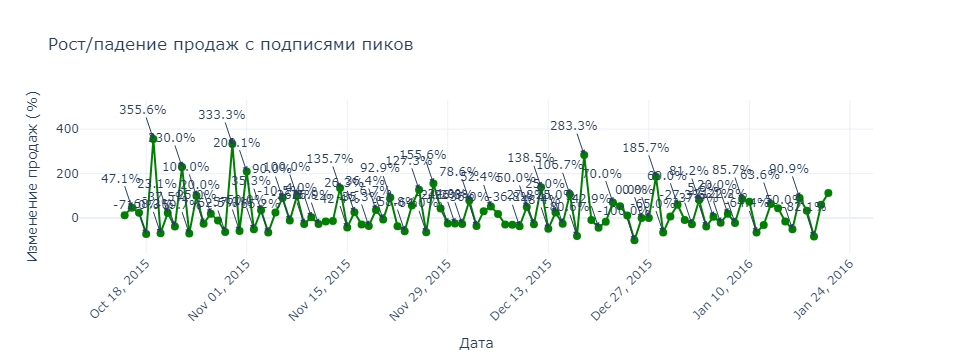

In [19]:
# Построение графика изменения продаж с подписями
plot_sales_change_compared_prev_period(processed_dates[1:], sales_change)

### 2.2 График процентные изменения продаж по сравнению с предыдущим периодом для каждого дня (цветные вершины)

In [20]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [21]:
def plot_sales_change_compared_color(dates, values, y_axis_title, graph_title):
    """
    Вход:
    - dates: Массив с датами.
    - values: Массив с изменениями (например, процент изменений или абсолютные значения).
    - y_axis_title: Название оси Y.
    - graph_title: Название графика.
    """
    
    fig = go.Figure()

    # Добавляем линию и метки на цветных вершинах
    fig.add_trace(go.Scatter(
        x=dates,
        y=values,
        mode='lines+markers',
        marker=dict(
            size=8,
            color=np.where(values > 0, 'green', np.where(values < 0, 'red', 'darkgoldenrod')),
        ),
        line=dict(color='gray'),
        name='Значения'
    ))

    # Логика для добавления подписей
    for i, (date, value) in enumerate(zip(dates, values)):
        if value != 0:
            fig.add_annotation(
                x=date,
                y=value,
                text=f'{value:.1f}%',
                showarrow=True,
                arrowhead=1,
                ax=0,
                ay=-20
            )

    # Настраиваем оси и заголовок
    fig.update_layout(
        title=graph_title,
        xaxis_title="Дата",
        yaxis_title=y_axis_title,
        template="plotly_white",
        legend=dict(x=0.01, y=0.99)
    )

    # Отображение графика
    fig.show()

In [22]:
# Применение пайплайна для получения последних 100 записей
processed_dates, processed_sales = sales_pipeline_change_compared_prev_period(dates_list, sales_list)

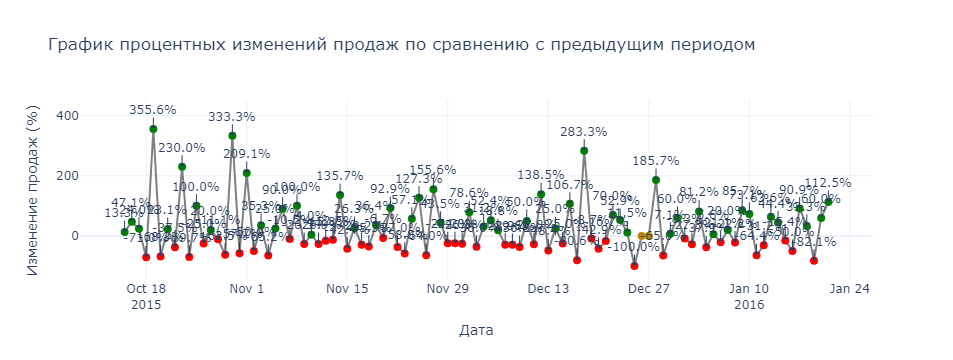

In [23]:
# Пример вызова функции с аргументами
plot_sales_change_compared_color(
    processed_dates[1:],            # Даты
    sales_change,                   # Процентные изменения продаж
    "Изменение продаж (%)",         # Название оси Y
    "График процентных изменений продаж по сравнению с предыдущим периодом"  # Заголовок графика
)

## 3. Скорость продажи товара (как быстро распродаются товары)

In [24]:
def sales_pipeline_speed(dates, sales, period='D'):
    """    
    Вход:
    - dates: Список с датами.
    - sales: Список с количеством продаж.
    - period: Период для ресемплирования данных ('D' - дни, 'M' - месяцы и т.д.).
    
    Выход:
    - Возвращает три массива: даты, скорость продаж, накопительные продажи.
    """
    
    dates = pd.to_datetime(np.array(dates))  # Преобразуем даты в формат datetime
    sales = np.array(sales)
    
    # Вычисляем скорость продаж (разница между днями)
    speed_sales = pd.Series(sales).diff().fillna(0).abs().tolist()
    
    # Вычисляем накопительные продажи
    cumulative_sales = pd.Series(sales).cumsum().tolist()
    
    # Создание DataFrame для ресемплирования данных
    data = pd.DataFrame({'Date': dates, 'Sales': sales})
    data.set_index('Date', inplace=True)
    
    # Агрегируем данные по указанному периоду
    resampled_data = data.resample(period).sum()
    
    return resampled_data.index.tolist(), speed_sales[:len(resampled_data)], cumulative_sales[:len(resampled_data)]

### 3.1 Динамика продаж товара

In [25]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [26]:
def plot_sales_speed_dynamics(dates, sales):
    """    
    Вход:
    - dates: Массив с датами.
    - sales: Массив с количеством продаж.
    """
    
    fig = go.Figure()

    # Добавляем данные на график
    fig.add_trace(go.Scatter(
        x=dates,
        y=sales,
        mode='lines+markers',
        marker=dict(color='blue', size=8),
        line=dict(color='blue'),
        name='Продажи'
    ))

    # Настраиваем внешний вид графика
    fig.update_layout(
        title="Динамика продаж товара",
        xaxis_title="Дата",
        yaxis_title="Продажи",
        template="plotly_white",
        xaxis_tickformat='%b %Y',
        xaxis_tickangle=-45
    )
    
    # Показать график
    fig.show()

In [27]:
# Применение пайплайна для получения данных
resampled_dates, speed_sales, cumulative_sales = sales_pipeline_speed(dates_list, sales_list, period='M')

C:\Users\Anastasia\AppData\Local\Temp\ipykernel_14624\2962001500.py:26: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



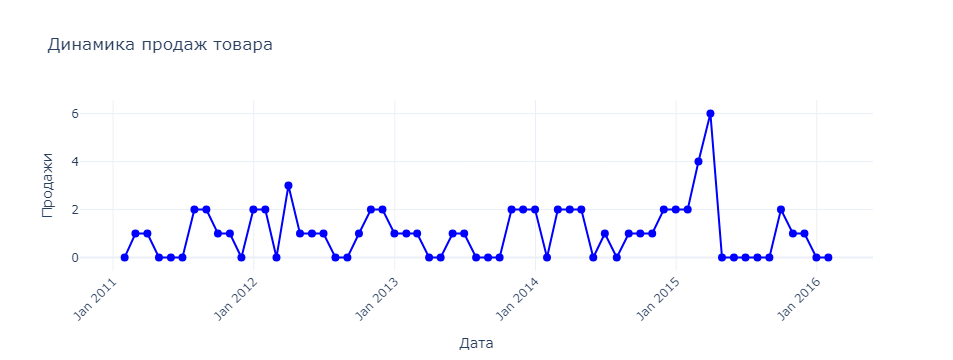

In [28]:
# Построение графика динамики продаж
plot_sales_speed_dynamics(resampled_dates, speed_sales)

### 3.2 Скорость продаж с цветовым градиентом

In [29]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [30]:
def plot_sales_speed_dynamics_color_dots(dates, speed_sales, color_scale='rainbow'):
    """
    Строит интерактивный график скорости продаж с цветовой шкалой.
    
    Вход:
    - dates: Массив с датами.
    - speed_sales: Массив со скоростью продаж.
    - color_scale: Цветовая шкала для скорости продаж 
    """
    
    fig = go.Figure()

    # Добавляем линию с изменением цвета по градиенту скорости продаж
    fig.add_trace(go.Scatter(
        x=dates,
        y=speed_sales,
        mode='lines+markers',
        marker=dict(
            size=8,
            color=speed_sales,   # Цветовой градиент
            colorscale=color_scale,  # Выбранная цветовая шкала
            showscale=True,
            colorbar=dict(title="Скорость продаж")
        ),
        line=dict(color='black', width=2),
        name="Скорость продаж"
    ))

    # Настраиваем график
    fig.update_layout(
        title="Скорость продаж товара",
        xaxis_title="Дата",
        yaxis_title="Скорость продаж",
        template="plotly_white",
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        font=dict(size=14, color='Black'),
    )

    fig.show()

In [31]:
# Применение пайплайна для получения данных
resampled_dates, speed_sales, cumulative_sales = sales_pipeline_speed(dates_list, sales_list, period='M')

C:\Users\Anastasia\AppData\Local\Temp\ipykernel_14624\2962001500.py:26: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



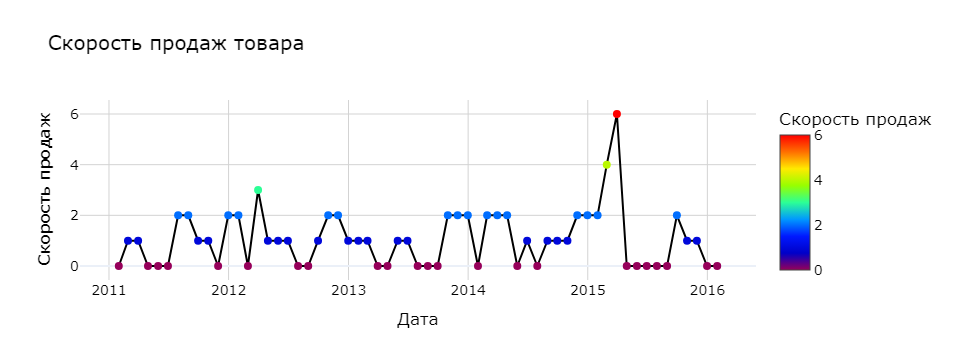

In [32]:
# Построение графика динамики продаж
plot_sales_speed_dynamics_color_dots(resampled_dates, speed_sales)

## 4. Пики продаж (месяц)

In [33]:
def  sales_pipeline_peaks_months(dates, sales, period='M'):
    """    
    Вход:
    - dates: Список с датами.
    - sales: Список с продажами.
    - period: Период для ресемплирования ('M' для месяцов).
    
    Выход:
    - Месяцы и максимальные продажи за этот период.
    """
    
    # Преобразуем даты в формат datetime и создаем DataFrame
    data = pd.DataFrame({'Date': dates, 'Sales': sales})
    data['Date'] = pd.to_datetime(data['Date'])
    
    # Устанавливаем индекс
    data.set_index('Date', inplace=True)
    
    # Ресемплируем по месяцам и находим максимальные продажи
    monthly_peaks = data.resample(period).max()
    
    return monthly_peaks.index, monthly_peaks['Sales']

### 4.1  Диаграмма с накоплением (Area Chart) — по годам сетка

In [34]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [42]:
def plot_sales_peaks_area_grid(dates, sales_peaks):
    """
    Строит диаграмму пиков продаж по месяцам в виде сетки по годам.
    
    Вход:
    - dates: Массив с датами.
    - sales_peaks: Массив с пиками продаж.
    """
    
   # Преобразуем даты и создаем DataFrame для удобства фильтрации по годам
    data = pd.DataFrame({'Date': dates, 'Sales': sales_peaks})
    data['Year'] = data['Date'].dt.year
    unique_years = data['Year'].unique()

    # Задаем сетку 3x2
    rows, cols = 3, 2  # Сетка 3 строки и 2 столбца
    fig = make_subplots(
        rows=rows, cols=cols, 
        subplot_titles=[f'Пики продаж за {year}' for year in unique_years]
    )

    # Построение графиков по каждому году
    for i, year in enumerate(unique_years):
        yearly_data = data[data['Year'] == year]
        
        # Индексы для расстановки графиков по сетке
        row = i // cols + 1
        col = i % cols + 1
        
        # Добавление данных на график
        fig.add_trace(go.Scatter(
            x=yearly_data['Date'], 
            y=yearly_data['Sales'], 
            fill='tozeroy', 
            mode='lines+markers', 
            marker=dict(color='blue'),
            line=dict(color='blue'),
            name=f'Пики продаж за {year}'
        ), row=row, col=col)

        # Добавление подписей на пиковые точки
        for date, peak in zip(yearly_data['Date'], yearly_data['Sales']):
            fig.add_annotation(x=date, y=peak, text=f'{peak:.1f}', showarrow=True, row=row, col=col)

    # Настройка макета
    fig.update_layout(
        title="Диаграмма пиков продаж по годам",
        template="plotly_white",
        height=1000,  # Увеличиваем высоту
        width=1500,   # Увеличиваем ширину
        margin=dict(t=50, l=50, r=50, b=50),  # Отступы
        font=dict(size=12)  # Увеличиваем размер шрифта
    )

    pio.show(fig)

In [43]:
# Вызов пайплайна для вычисления пиков продаж по месяцам
processed_dates, monthly_peaks = sales_pipeline_peaks_months(dates_list, sales_list, period='M')

C:\Users\Anastasia\AppData\Local\Temp\ipykernel_14624\703740196.py:20: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



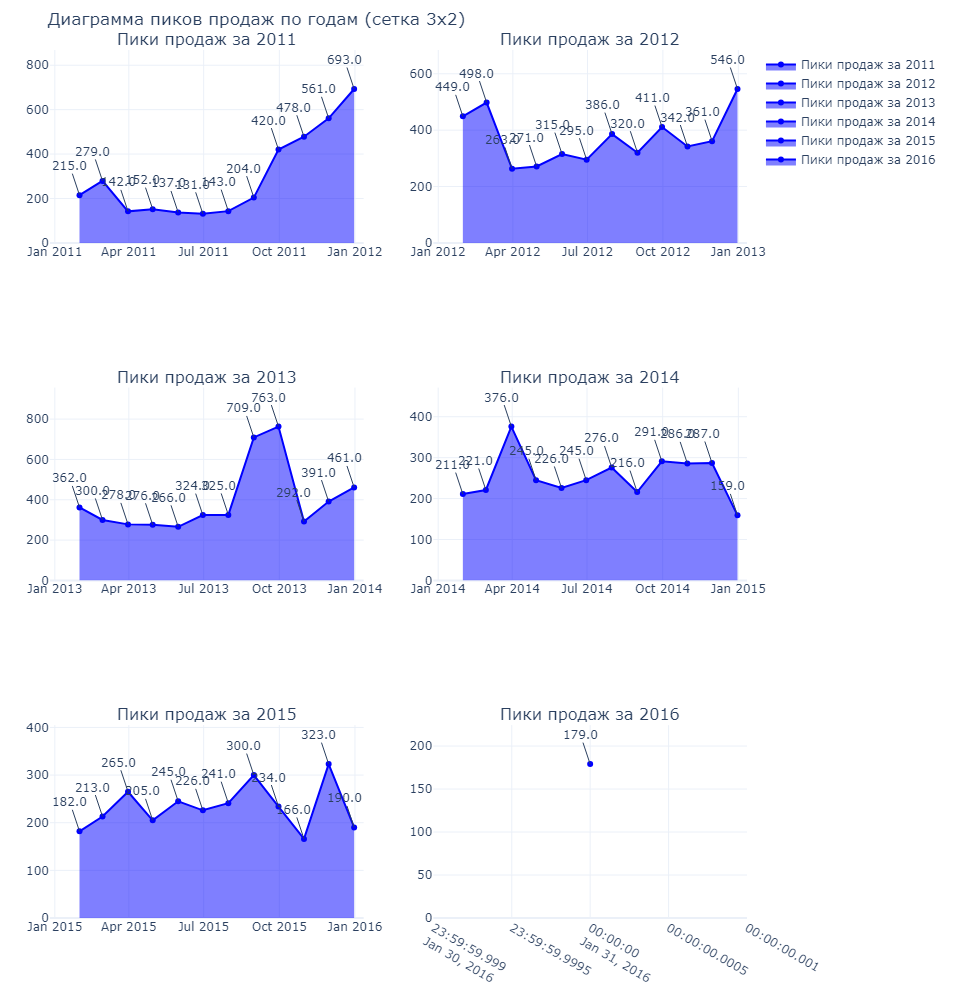

In [44]:
# Построение диаграммы пиков продаж
plot_sales_peaks_area_grid(processed_dates, monthly_peaks)

### 4.2 Круговая диаграмма (Pie Chart) — по годам сетка

In [45]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [46]:
def plot_sales_peaks_months_pie_grid(dates, sales_peaks):
    """
    Вход:
    - dates: Массив с датами.
    - sales_peaks: Массив с пиками продаж.
    """
    
    # Преобразуем даты и создаем DataFrame для удобства фильтрации по годам
    data = pd.DataFrame({'Date': dates, 'Sales': sales_peaks})
    data['Year'] = data['Date'].dt.year
    unique_years = data['Year'].unique()

    # Убираем пустой график, если количество лет меньше чем 6
    rows, cols = (len(unique_years) + 2) // 3, 3
    
    # Создаем сетку с типом подграфиков "domain" для круговых диаграмм
    fig = make_subplots(
        rows=rows, cols=3, 
        specs=[[{'type': 'domain'} for _ in range(3)] for _ in range(rows)],
        subplot_titles=[f'Пики продаж за {year}' for year in unique_years]
    )

    # Построение круговых диаграмм по каждому году
    for i, year in enumerate(unique_years):
        yearly_data = data[data['Year'] == year]
        
        # Индексы для расстановки графиков по сетке
        row = i // 3 + 1
        col = i % 3 + 1
        
        # Добавление данных на круговую диаграмму
        fig.add_trace(go.Pie(
            labels=yearly_data['Date'].dt.strftime('%b'), 
            values=yearly_data['Sales'],
            hole=0.3,
            textinfo='label+percent',
            showlegend=False
        ), row=row, col=col)

    # Настройка макета с увеличенным отступом сверху
    fig.update_layout(
        title="Круговые диаграммы пиков продаж по годам",
        template="plotly_white",
        height=700,  # Увеличим высоту для большего отступа
        margin=dict(t=100, l=10, r=10, b=10)  # Увеличиваем отступ сверху (t=100)
    )

    # Показываем график
    fig.show()

In [47]:
# Вызов пайплайна для вычисления пиков продаж по месяцам
processed_dates, monthly_peaks = sales_pipeline_peaks_months(dates_list, sales_list, period='MS')

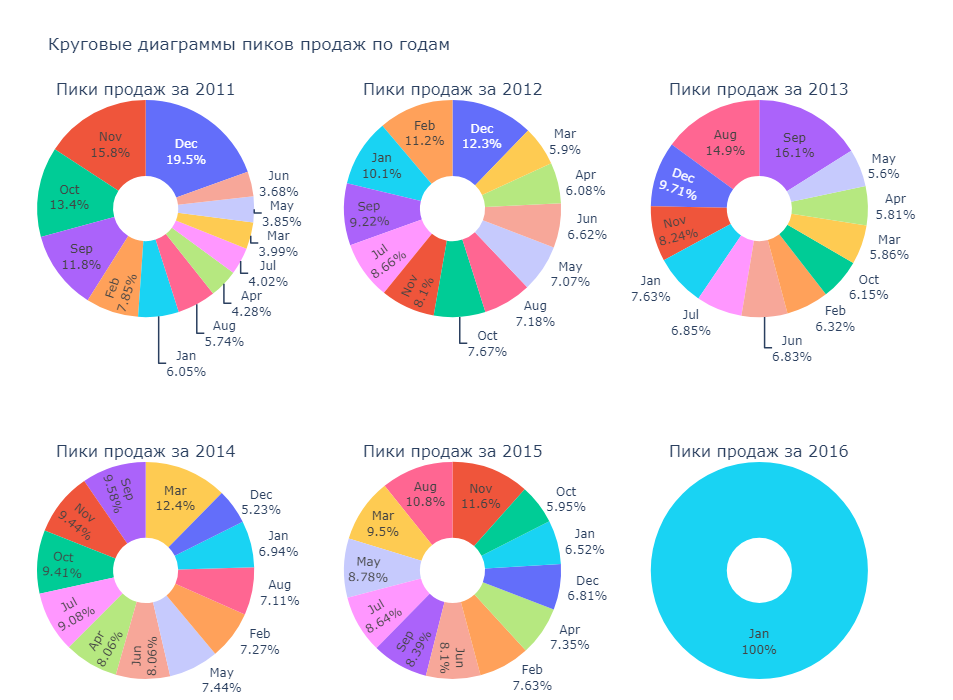

In [48]:
# Построение круговой диаграммы пиков продаж по годам
plot_sales_peaks_months_pie_grid(processed_dates, monthly_peaks)

### 4.3 Обычный

In [49]:
# Преобразование колонок 'date' и 'cnt' в списки
dates_list = data['date'].tolist()  # Преобразуем даты в список
sales_list = data['cnt'].tolist()   # Преобразуем количество продаж в список

In [50]:
def plot_sales_peaks_months_line(dates, sales_peaks):
    """    
    Вход:
    - dates: Массив с датами.
    - sales_peaks: Массив с пиками продаж.
    """
    
    # Создание линейного графика
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=dates, 
        y=sales_peaks, 
        mode='lines+markers', 
        line=dict(color='blue'), 
        marker=dict(size=8, color='blue'),
        name='Пики продаж'
    ))

    # Добавление подписей на пиковые точки
    for date, peak in zip(dates, sales_peaks):
        fig.add_annotation(x=date, y=peak, text=f'{peak:.1f}', showarrow=True, ax=0, ay=-20)

    # Настройка макета
    fig.update_layout(
        title="Пики продаж (месяц)",
        xaxis_title="Дата",
        yaxis_title="Максимальные продажи (единиц/месяц)",
        template="plotly_white",
        height=600,
        width=1000
    )
    
    pio.show(fig)

In [51]:
# Вызов пайплайна для вычисления пиков продаж по месяцам
processed_dates, monthly_peaks = sales_pipeline_peaks_months(dates_list, sales_list, period='MS')

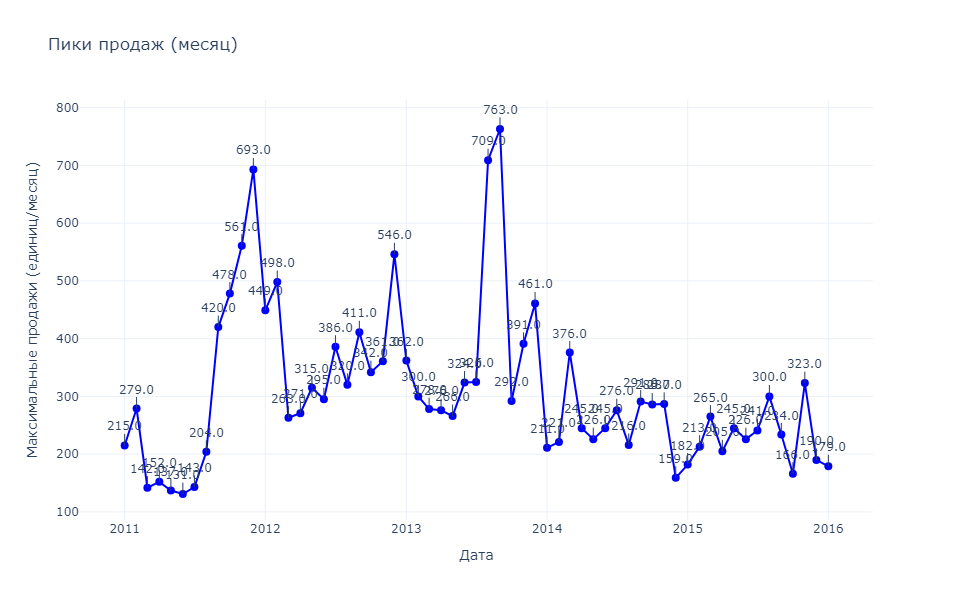

In [52]:
plot_sales_peaks_months_line(processed_dates, monthly_peaks)

## 5. Пики продаж (день)

In [123]:
# Функция для пайплайна обработки данных

def sales_pipeline(dates_list, sales_list):
    data = pd.DataFrame({'Date': dates_list, 'Sales': sales_list})
    data['Date'] = pd.to_datetime(data['Date'])  # Преобразуем дату в формат datetime
    data.set_index('Date', inplace=True)
    return data

### 5.1 Пики продаж (день) с указанием месца и года

In [124]:
def plot_sales_peaks_plotly(year, month, sales_data):
    # Фильтруем данные по выбранному году и месяцу
    filtered_data = sales_data[(sales_data.index.year == year) & (sales_data.index.month == month)]
    
    if filtered_data.empty:
        print(f"Нет данных для {year}-{month}.")
        return

    # Группируем данные по дням и считаем количество продаж
    daily_sales = filtered_data.groupby(filtered_data.index.day).sum()

    # Строим график
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=daily_sales.index,
        y=daily_sales['Sales'],
        mode='lines+markers',
        line=dict(color='green'),
        marker=dict(size=8),
        name="Количество продаж"
    ))

    # Настраиваем оформление графика
    fig.update_layout(
        title=f"Пики продаж по дням ({year}-{month})",
        xaxis_title="День",
        yaxis_title="Количество продаж",
        template='plotly_white',
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        font=dict(size=14, color='Black'),
        height=600,
        width=900
    )

    # Отображаем график
    pio.show(fig)

In [125]:
# Запрашиваем у пользователя год и месяц
year = 2013
month = 3

In [126]:
processed_data = sales_pipeline(dates_list, sales_list)

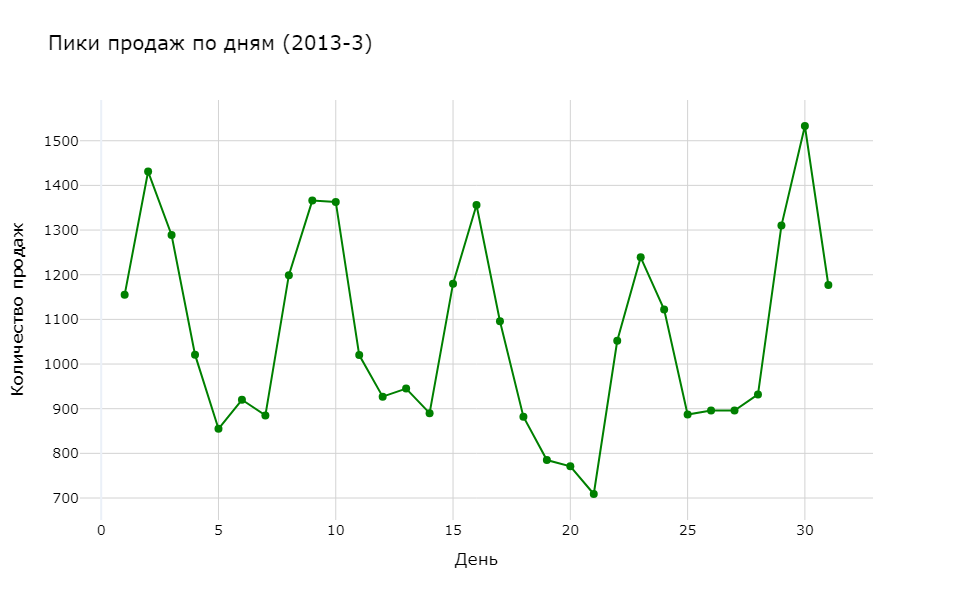

In [127]:
plot_sales_peaks_plotly(year, month, processed_data)

### 5.2 Пики продаж (день) с наложением 

In [143]:
# Подготавливаем данные для пайплайна
dates_list = data['date'].tolist()
sales_list = data['cnt'].tolist()

In [141]:
def plot_sales_peaks_overlay_filled(year, months, sales_data):
    fig = go.Figure()

    # Используем цвета для линий
    colors = ['#FF6347', '#4682B4', '#3CB371']  # Цвета для трех месяцев

    # Проходим по каждому месяцу
    for i, month in enumerate(months):
        # Фильтруем данные по выбранному году и месяцу
        filtered_data = sales_data[(sales_data.index.year == year) & (sales_data.index.month == month)]

        if filtered_data.empty:
            print(f"Нет данных для {year}-{month}. Пропускаем...")
            continue

        # Группируем данные по дням и считаем количество продаж
        daily_sales = filtered_data.groupby(filtered_data.index.day).sum()

        # Строим график с линиями и заполнением под ними
        fig.add_trace(go.Scatter(
            x=daily_sales.index,
            y=daily_sales['Sales'],
            mode='lines+markers',
            line=dict(color=colors[i], width=2.5),
            fill='tozeroy',  # Заполняем пространство под линией
            name=f"{month} месяц"
        ))

    # Настраиваем оформление графика
    fig.update_layout(
        title=f"Наложение пиков продаж по дням с заполнением ({year})",
        xaxis_title="День",
        yaxis_title="Количество продаж",
        template='plotly_white',
        showlegend=True,
        width=900,
        height=600,
        font=dict(size=14, color="Black")
    )

    fig.show()

In [142]:
# Запрашиваем год и месяцы для наложения
year = 2015
months = [9, 10, 11]  # Сентябрь, октябрь и ноябрь

In [144]:
# Пропускаем данные через пайплайн
processed_data = sales_pipeline(dates_list, sales_list)

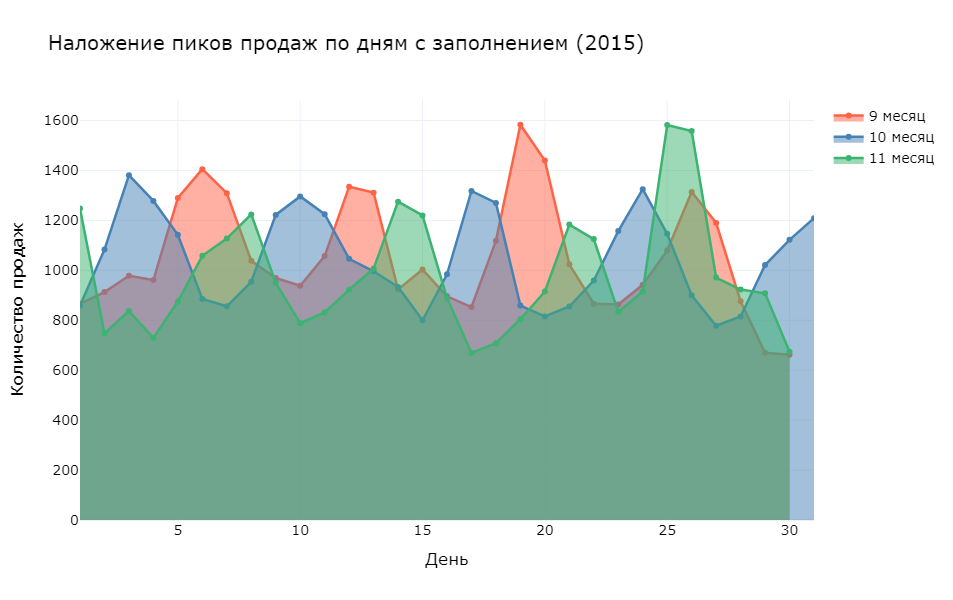

In [145]:
# Построение графика с наложением выбранных месяцев и заполнением
plot_sales_peaks_overlay_filled(year, months, processed_data)

### 6.  График  зависимости спроса от внешних факторов

In [189]:
# Функция для пайплайна обработки данных
def sales_pipeline_with_event(dates_list, sales_list, event_column):
    # Создаем DataFrame из данных
    df = pd.DataFrame({'Date': dates_list, 'Sales': sales_list, 'Event': event_column})
    
    # Преобразуем дату в формат datetime
    df['Date'] = pd.to_datetime(df['Date'])
    
    # Заменяем пустые строки на 'None', если нет событий
    df['Event'] = df['Event'].replace('', 'None')
    
    return df

In [190]:
# Функция для построения графика
def plot_sales_with_events(dates, sales, event_type, title):
    # Создаем график
    fig = go.Figure()

    # Добавляем линию и точки на график
    fig.add_trace(go.Scatter(
        x=dates,
        y=sales,
        mode='lines+markers',
        marker=dict(size=8, color='blue'),
        line=dict(color='blue', width=2),
        name='Количество продаж'
    ))

    # Настраиваем оформление графика
    fig.update_layout(
        title=title,
        xaxis_title='Дата',
        yaxis_title='Количество продаж',
        template='plotly_white',
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        font=dict(size=14, color='Black'),
        height=600,
        width=900
    )

    fig.show()

In [191]:
# Применяем пайплайн для обработки данных с одной колонкой событий
processed_data = sales_pipeline_with_event(data['date'], data['cnt'], data['event_name_1'])

In [192]:
# Пример: фильтруем по типу события (например, праздники)
event_type = 'Holiday'  # Пример фильтрации по типу события 'Holiday'

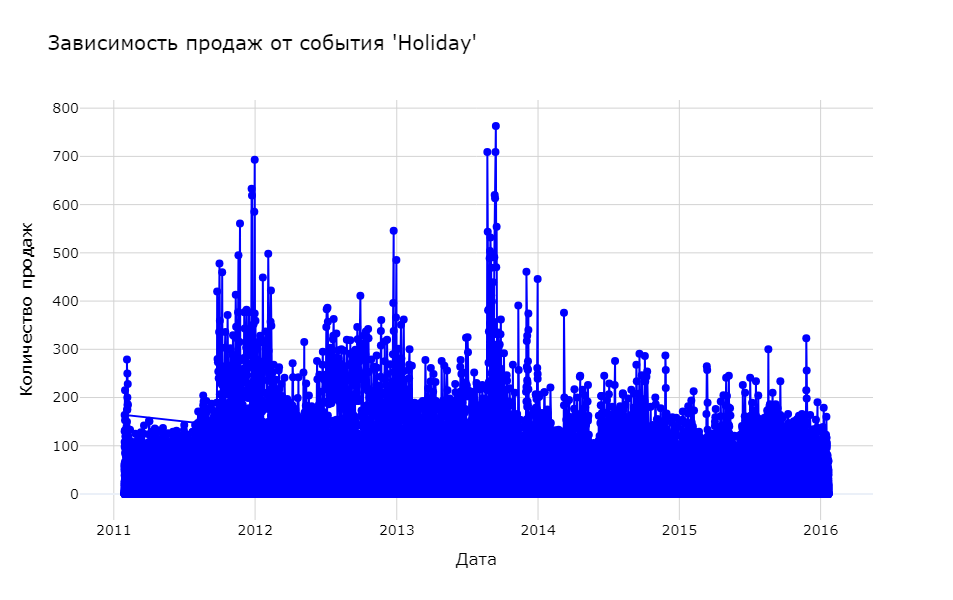

In [193]:
# Строим график зависимости продаж от праздников
plot_sales_with_events(processed_data['Date'], processed_data['Sales'], event_type, "Зависимость продаж от события 'Holiday'")

In [198]:
def sales_pipeline_with_event(dates_list, sales_list, event_column):
    # Создаем DataFrame из данных
    df = pd.DataFrame({'Date': dates_list, 'Sales': sales_list, 'Event': event_column})
    
    # Преобразуем дату в формат datetime
    df['Date'] = pd.to_datetime(df['Date'])
    
    # Заменяем пустые строки на 'None', если нет событий
    df['Event'] = df['Event'].replace('', 'None')
    
    return df

In [199]:
# Функция для построения тепловой карты
def plot_sales_heatmap_with_events(data, title):
    # Группируем данные по событиям и датам, суммируя продажи
    grouped_data = pd.pivot_table(data=data, index='Date', columns='Event', values='Sales', aggfunc='sum', fill_value=0)

    # Преобразуем индекс в строки (формат даты)
    grouped_data.index = grouped_data.index.strftime('%Y-%m-%d')

    # Строим тепловую карту
    fig = go.Figure(data=go.Heatmap(
        z=grouped_data.values,
        x=grouped_data.columns,
        y=grouped_data.index,
        colorscale='Viridis'
    ))

    # Настраиваем оформление графика
    fig.update_layout(
        title=title,
        xaxis_title='События',
        yaxis_title='Дата',
        template='plotly_white',
        height=600,
        width=900
    )

    pio.show(fig)

In [200]:
# Применяем пайплайн для обработки данных с одной колонкой событий
processed_data = sales_pipeline_with_event(data['date'], data['cnt'], data['event_name_1'])

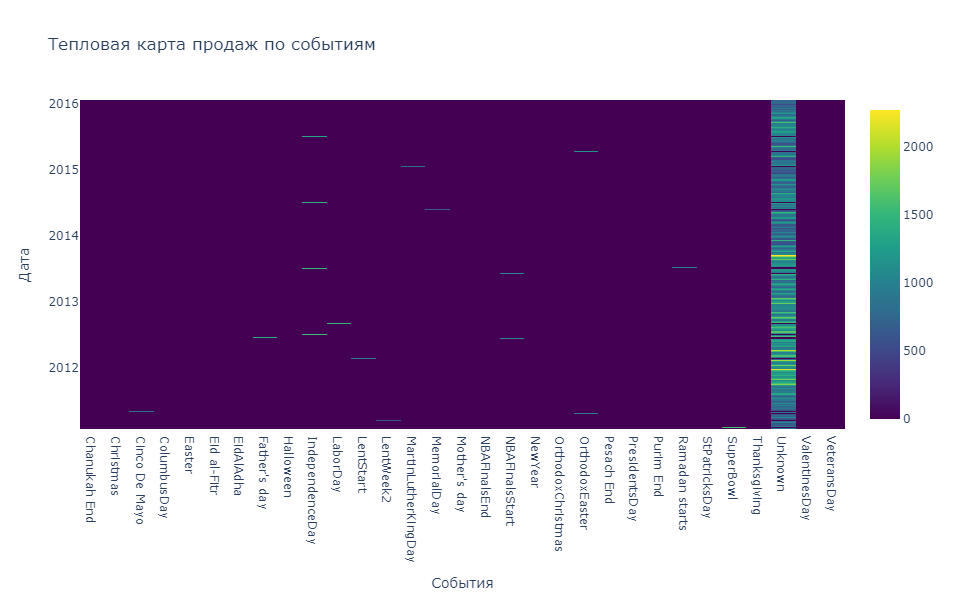

In [202]:
# Строим тепловую карту зависимости продаж от событий
plot_sales_heatmap_with_events(processed_data, "Тепловая карта продаж по событиям")

### 6.  График частоты повторных покупок

In [222]:
# Пайплайн для обработки данных
def repeat_purchase_pipeline(dates, sales):
    sales_by_date = pd.DataFrame({'Date': dates, 'Sales': sales}).groupby('Date').sum()
    repeat_rate = sales_by_date.rolling(window=7).mean()  # Скользящее среднее за 7 дней
    return sales_by_date.index, repeat_rate

### 6.1 Линейный график частоты повторных покупок

In [224]:
# Преобразуем данные и строим график
dates_list = data['date'].tolist()
sales_list = data['cnt'].tolist()

In [223]:
# Функция для построения графика
def plot_repeat_purchase_plotly(dates, repeat_rate):
    fig = go.Figure()

    # Добавляем линию и маркеры
    fig.add_trace(go.Scatter(
        x=dates, 
        y=repeat_rate['Sales'],
        mode='lines+markers',
        line=dict(color='blue'),
        marker=dict(size=6, color='blue'),
        name='Частота покупок'
    ))

    # Настройка оформления графика
    fig.update_layout(
        title="Частота повторных покупок (скользящее среднее за 7 дней)",
        xaxis_title="Дата",
        yaxis_title="Частота покупок (среднее количество)",
        template='plotly_white',
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        font=dict(size=14, color='Black'),
        height=600,
        width=900
    )

    fig.show()

In [225]:
processed_dates, repeat_rate = repeat_purchase_pipeline(dates_list, sales_list)

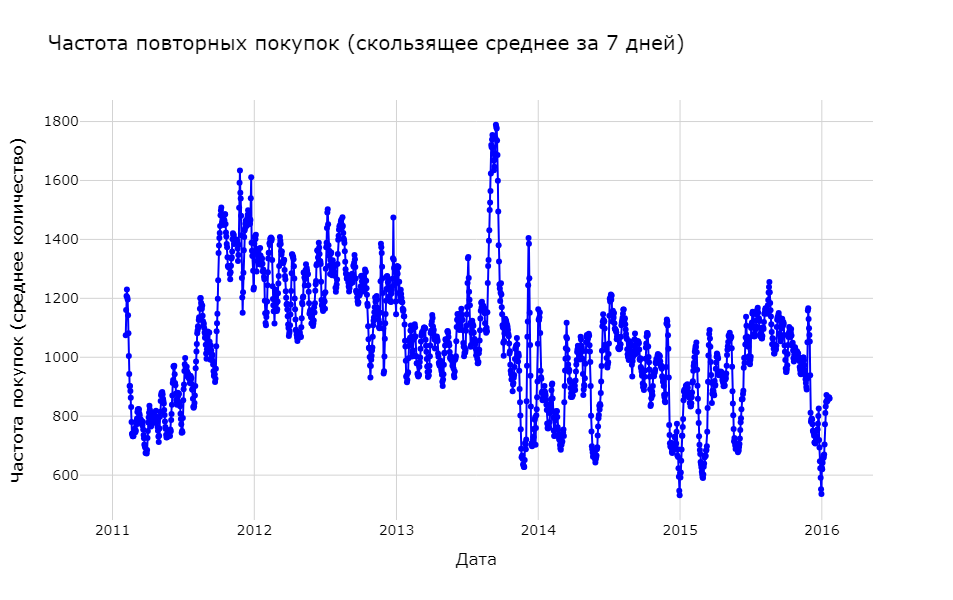

In [226]:
plot_repeat_purchase_plotly(processed_dates, repeat_rate)

### 6.2 Гистограмма частоты покупок

In [229]:
# Преобразуем данные и строим график
dates_list = data['date'].tolist()
sales_list = data['cnt'].tolist()

In [227]:
# Функция для построения гистограммы
def plot_histogram_plotly(sales_list):
    fig = go.Figure()

    # Добавляем гистограмму
    fig.add_trace(go.Histogram(
        x=sales_list, 
        nbinsx=20, 
        marker_color='green', 
        opacity=0.7, 
        marker_line=dict(color='black', width=1)
    ))

    # Настройка оформления графика
    fig.update_layout(
        title="Распределение частоты покупок (как часто покупают определённое количество товаров)",
        xaxis_title="Количество покупок",
        yaxis_title="Частота",
        template='plotly_white',
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        font=dict(size=14, color='Black'),
        height=600,
        width=900
    )

    fig.show()

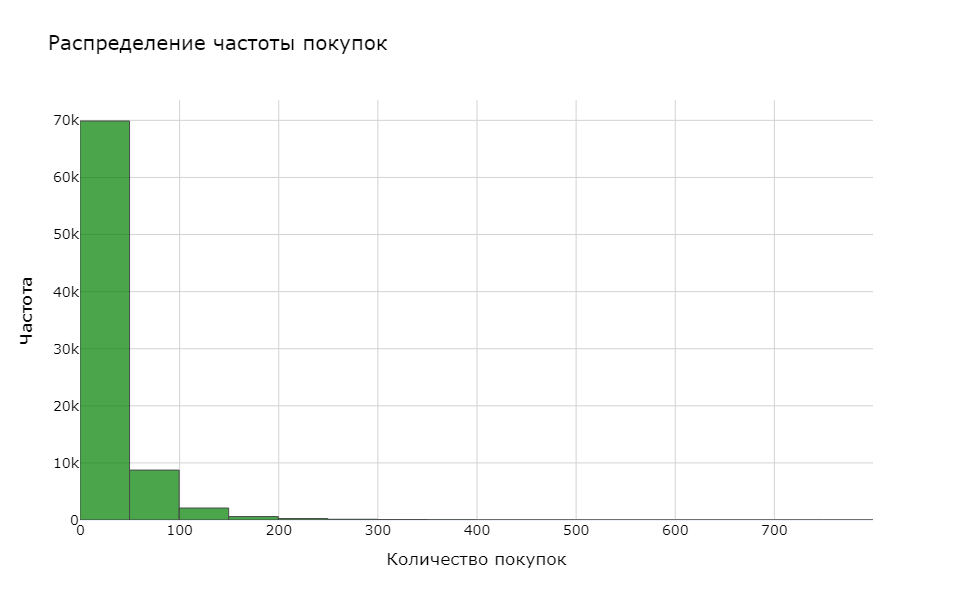

In [228]:
plot_histogram_plotly(sales_list)

## 7. Востребованность продукта

In [230]:
# Пайплайн для обработки данных
def product_sales_pipeline(data):
    """
    Пайплайн для обработки данных: подсчёт продаж каждого продукта и выбор топ 5 и bottom 5.
    """
    # Сгруппируем данные по продуктам и посчитаем общее количество продаж
    grouped_data = data.groupby('item_id')['cnt'].sum().reset_index()
    
    # Отсортируем данные для получения топ 5 востребованных и топ 5 невостребованных продуктов
    top_5 = grouped_data.nlargest(5, 'cnt')  # Топ 5 востребованных
    bottom_5 = grouped_data.nsmallest(5, 'cnt')  # Топ 5 невостребованных
    
    # Объединяем топ 5 и bottom 5
    top_and_bottom_5 = pd.concat([top_5, bottom_5])
    
    return top_and_bottom_5

In [235]:
### 7.1 Востребованность продукта - общий график для всех магазинов

In [231]:
# 2. Функция для построения графика
def plot_top_bottom_5_products(data):
    """
    Построение графика для топ 5 востребованных и топ 5 невостребованных продуктов.
    """
    # Разделение на топ 5 и bottom 5
    top_5 = data.nlargest(5, 'cnt')
    bottom_5 = data.nsmallest(5, 'cnt')
    
    # Создаем фигуру
    fig = go.Figure()

    # Добавляем бары для топ 5 продуктов
    fig.add_trace(go.Bar(
        x=top_5['item_id'],
        y=top_5['cnt'],
        name="Топ 5 востребованных продуктов",
        marker_color='green'
    ))

    # Добавляем бары для bottom 5 продуктов
    fig.add_trace(go.Bar(
        x=bottom_5['item_id'],
        y=bottom_5['cnt'],
        name="Топ 5 невостребованных продуктов",
        marker_color='red'
    ))

    # Настройка оформления графика
    fig.update_layout(
        title="Топ 5 востребованных и невостребованных продуктов",
        xaxis_title="Идентификатор продукта",
        yaxis_title="Количество продаж",
        template='plotly_white',
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='LightGrey'),
        font=dict(size=14, color='Black'),
        height=600,
        width=900,
        barmode='group'  # Для группировки столбцов
    )

    fig.show()

In [232]:
# Обработка данных через пайплайн
processed_data = product_sales_pipeline(data)

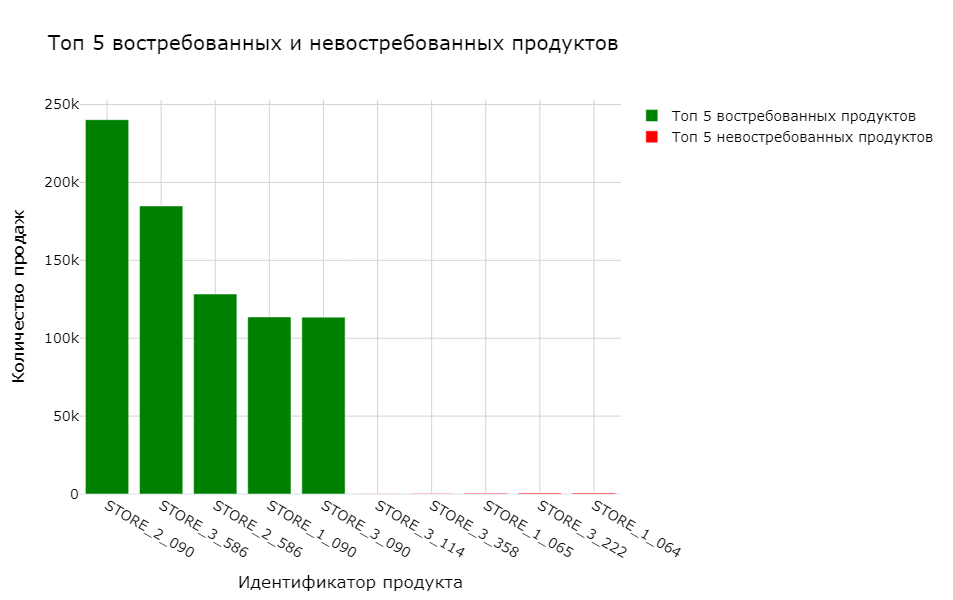

In [234]:
plot_top_bottom_5_products(processed_data)

### 7.2 Востребованность продукта - по укаждому магазину

In [246]:
# Пайплайн для обработки данных для каждого магазина (оставляем только топ 5 товаров)
def store_top5_sales_pipeline(data):
    """
    Пайплайн для обработки данных по магазинам. Возвращает топ 5 товаров для каждого магазина.
    """
    grouped_data = data.groupby(['store_id', 'item_id'])['cnt'].sum().reset_index()
    stores_data = {}

    for store in grouped_data['store_id'].unique():
        store_data = grouped_data[grouped_data['store_id'] == store]
        top_5 = store_data.nlargest(5, 'cnt')
        stores_data[store] = {'top_5': top_5}
    
    return stores_data

In [258]:
# Построение сетки графиков
def plot_store_top5_sales_grid(stores_data):
    """
    Построение сетки графиков для каждого магазина с топ 5 товаров.
    """
    num_stores = len(stores_data)
    cols = 2  # Фиксируем количество колонок на 2
    rows = math.ceil(num_stores / cols)  # Автоматический расчет количества строк

    fig = make_subplots(rows=rows, cols=cols, subplot_titles=[f"Магазин {store}" for store in stores_data.keys()])

    for i, (store, data) in enumerate(stores_data.items()):
        row = (i // cols) + 1
        col = (i % cols) + 1

        # Добавляем топ 5 товаров
        fig.add_trace(go.Bar(
            x=data['top_5']['item_id'],
            y=data['top_5']['cnt'],
            name=f"Топ 5 для магазина {store}",
            marker_color='green'
        ), row=row, col=col)

    fig.update_layout(
        height=600 + (rows * 300),
        width=1000,
        title_text="Топ 5 востребованных товаров по магазинам",
        showlegend=False,
        template='plotly_white'
    )

    fig.show()

In [259]:
stores_data = store_top5_sales_pipeline(data)

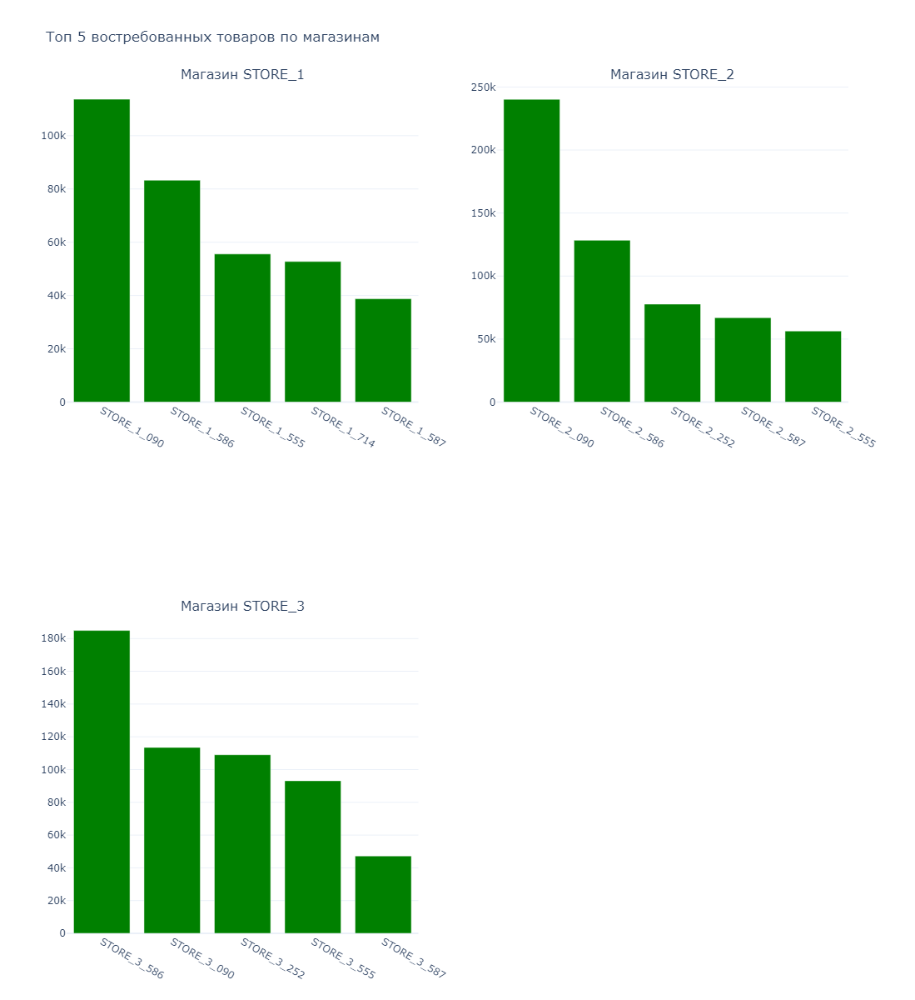

In [260]:
plot_store_top5_sales_grid(stores_data)

### 7.3 Построение круговой диаграммы для каждого магазина:

In [254]:
# Пайплайн для расчета долей продаж каждого товара в магазине
def store_sales_share_pipeline(data):
    """
    Пайплайн для расчета доли продаж товаров по магазинам.
    Возвращает долю каждого товара по магазину.
    """
    grouped_data = data.groupby(['store_id', 'item_id'])['cnt'].sum().reset_index()
    total_sales_by_store = grouped_data.groupby('store_id')['cnt'].sum().reset_index()

    grouped_data = pd.merge(grouped_data, total_sales_by_store, on='store_id', suffixes=('', '_total'))
    grouped_data['share'] = grouped_data['cnt'] / grouped_data['cnt_total'] * 100  # Расчет доли в процентах
    
    stores_data = {}

    for store in grouped_data['store_id'].unique():
        store_data = grouped_data[grouped_data['store_id'] == store]
        stores_data[store] = store_data

    return stores_data

In [267]:
# Построение сетки круговых диаграмм
def plot_store_sales_share_grid(stores_data):
    """
    Построение сетки круговых диаграмм для каждого магазина с долями продаж товаров.
    """
    num_stores = len(stores_data)
    cols = 2  # Фиксируем количество колонок на 2
    rows = math.ceil(num_stores / cols)  # Автоматический расчет количества строк

    fig = make_subplots(rows=rows, cols=cols, subplot_titles=[f"Магазин {store}" for store in stores_data.keys()],
                        specs=[[{'type': 'domain'} for _ in range(cols)] for _ in range(rows)])

    for i, (store, data) in enumerate(stores_data.items()):
        row = (i // cols) + 1
        col = (i % cols) + 1

        # Добавляем круговую диаграмму для каждого магазина
        fig.add_trace(go.Pie(
            labels=data['sales_share']['item_id'],
            values=data['sales_share']['sales_share'],
            name=f"Магазин {store}",
            hole=0.4
        ), row=row, col=col)

    fig.update_layout(
        height=600 + (rows * 300),
        width=1000,
        title_text="Доли продаж товаров по магазинам",
        showlegend=False,
        template='plotly_white'
    )

    fig.show()

In [268]:
stores_share_data = store_sales_share_pipeline(data)

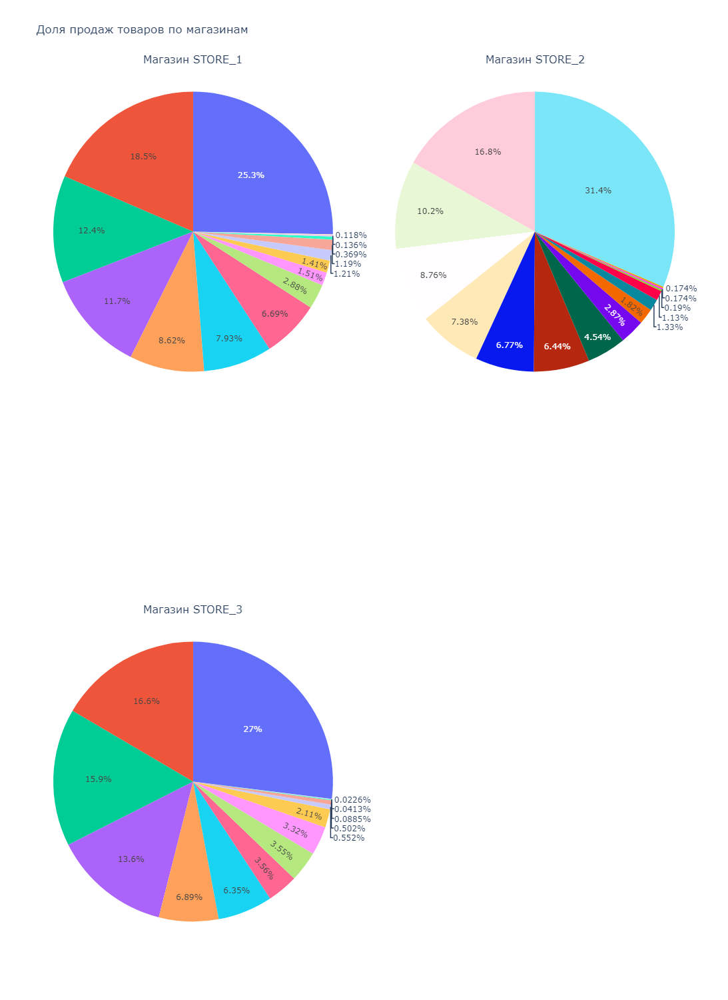

In [269]:
plot_store_sales_share_pie(stores_share_data)

## 8 Выручка по магазинам

In [291]:
data['date'] = pd.to_datetime(data['date'])

In [292]:
# Функция для расчета выручки по дням и неделям
def store_revenue_pipeline(data):
    # Создаем столбец выручки (цена * количество)
    data['revenue'] = data['sell_price'] * data['cnt']
    
    # Группируем данные по магазинам, дням и неделям
    stores_data = {}
    for store in data['store_id'].unique():
        store_data = data[data['store_id'] == store]
        
        # Выручка за каждый день
        daily_revenue = store_data.groupby('date')['revenue'].sum()
        
        # Выручка за каждую неделю
        weekly_revenue = store_data.groupby(pd.Grouper(key='date', freq='W'))['revenue'].sum()
        
        stores_data[store] = {'daily_revenue': daily_revenue, 'weekly_revenue': weekly_revenue}
    
    return stores_data

In [293]:
# Функция для построения графиков в сетке
def plot_store_revenue_grid(stores_data):
    # Определяем количество строк и колонок для сетки графиков
    rows = len(stores_data)
    cols = 2  # Одна колонка для дневной выручки, другая для недельной
    
    # Создаем фигуру с сеткой графиков
    fig = make_subplots(
        rows=rows, cols=cols,
        subplot_titles=[f"{store} - Выручка за дни" for store in stores_data.keys()] + 
                       [f"{store} - Выручка за недели" for store in stores_data.keys()],
        vertical_spacing=0.1
    )
    
    # Добавляем графики для каждого магазина
    row = 1
    for store, revenues in stores_data.items():
        # График выручки за дни
        fig.add_trace(
            go.Scatter(x=revenues['daily_revenue'].index, y=revenues['daily_revenue'], mode='lines+markers', name=f'{store} - Выручка за дни'),
            row=row, col=1
        )
        
        # График выручки за недели
        fig.add_trace(
            go.Scatter(x=revenues['weekly_revenue'].index, y=revenues['weekly_revenue'], mode='lines+markers', name=f'{store} - Выручка за недели'),
            row=row, col=2
        )
        
        row += 1
    
    # Настраиваем оформление графика
    fig.update_layout(
        height=rows * 400, width=1000,
        title_text="Выручка магазина за каждый день и неделю",
        template="plotly_white"
    )
    
    # Показываем график
    fig.show()

In [294]:
# Применяем пайплайн для получения данных по каждому магазину
stores_data = store_revenue_pipeline(data)

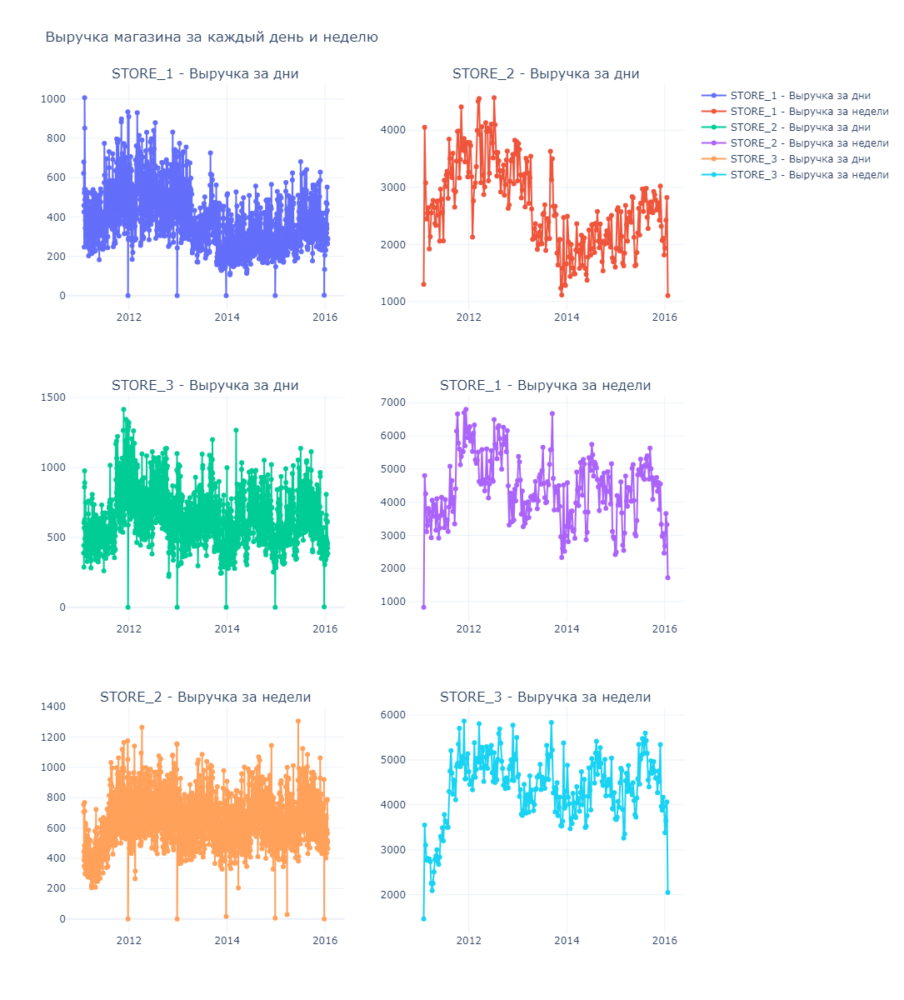

In [295]:
# Строим график
plot_store_revenue_grid(stores_data)

## 9. Сравнение продаж пр будням и выходным

In [310]:
dates_list = data['date'].tolist()
sales_list = data['cnt'].tolist()

In [306]:
# Функция для определения будний это день или выходной
def is_weekend(date):
    return date.weekday() >= 5  # 5 и 6 это суббота и воскресенье

In [307]:
# Пайплайн для обработки данных и получения продаж по будним и выходным дням за каждый месяц
def sales_weekday_weekend_by_month_pipeline(dates, sales_list):
    # Преобразуем список дат в формат datetime
    dates = pd.to_datetime(dates)
    
    # Отбираем только данные за 2015 год
    mask_2015 = dates.year == 2015
    dates = dates[mask_2015]
    sales_list = pd.Series(sales_list)[mask_2015].tolist()
    
    # Создаем DataFrame для удобной группировки
    df = pd.DataFrame({"date": dates, "sales": sales_list})
    
    # Добавляем колонку "Месяц"
    df['month'] = df['date'].dt.month
    
    # Группируем данные по месяцам и подсчитываем продажи по будням и выходным
    monthly_sales = df.groupby('month').apply(lambda x: {
        'weekday_sales': sum(x['sales'][~x['date'].apply(is_weekend)]),
        'weekend_sales': sum(x['sales'][x['date'].apply(is_weekend)])
    })
    
    return monthly_sales

In [308]:
# Функция для построения графика
def plot_weekday_weekend_sales_by_month(monthly_sales):
    months = range(1, 13)  # Список месяцев
    
    # Разбиваем данные на будние и выходные
    weekday_sales = [monthly_sales[m]['weekday_sales'] for m in months]
    weekend_sales = [monthly_sales[m]['weekend_sales'] for m in months]
    
    labels = ['Будни', 'Выходные']
    width = 0.35  # Ширина колонок
    
    plt.figure(figsize=(10, 6))
    p1 = plt.bar(months, weekday_sales, width, label='Будни', color='blue')
    p2 = plt.bar(months, weekend_sales, width, bottom=weekday_sales, label='Выходные', color='orange')
    
    plt.ylabel('Объем продаж')
    plt.title('Продажи по будним и выходным дням по месяцам 2015 года')
    plt.xticks(months)
    plt.legend()
    
    plt.show()

In [309]:
# Основной контроллер для обработки данных и построения графика
def main_controller(dates_list, sales_list):
    # Получаем продажи по будним и выходным за каждый месяц
    monthly_sales = sales_weekday_weekend_by_month_pipeline(dates_list, sales_list)
    
    # Строим график
    plot_weekday_weekend_sales_by_month(monthly_sales)

C:\Users\Anastasia\AppData\Local\Temp\ipykernel_14624\3479133661.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



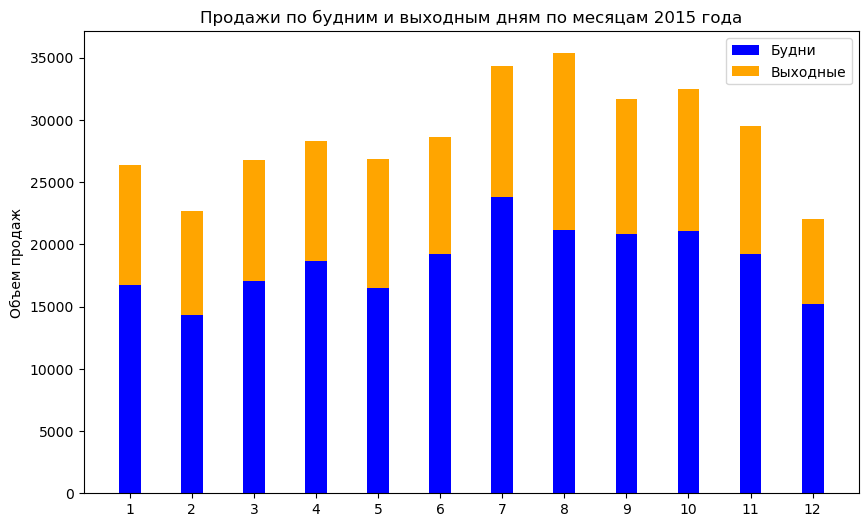

In [311]:
main_controller(dates_list, sales_list)

## 10. Анализ по праздникам

In [335]:
# Функция для проверки, идет ли праздние в день
def is_event_day(row):
    return row['event_name_1'] != 'Unknown' or row['event_name_2'] != 'Unknown'

In [336]:
# Пайплайн для разделения данных на периоды с праздниками и без
def sales_with_without_events_pipeline(data):
    # Определяем дни с акциями
    data['is_event_day'] = data.apply(is_event_day, axis=1)
    
    # Продажи в дни с праздгником
    sales_with_events = data[data['is_event_day']]['cnt'].sum()
    
    # Продажи в дни без  праздгника
    sales_without_events = data[~data['is_event_day']]['cnt'].sum()
    
    return sales_with_events, sales_without_events

In [337]:
# Функция для построения графика сравнения продаж
def plot_sales_comparison(sales_with, sales_without):
    labels = ['В день проведения праздника', 'Без праздника']
    sales_values = [sales_with, sales_without]
    
    plt.figure(figsize=(8, 6))
    plt.bar(labels, sales_values, color=['green', 'red'])
    plt.ylabel('Объем продаж')
    plt.title('Сравнение продаж в периоды проведения праздников')
    plt.show()

In [338]:
# Основной контроллер для обработки данных и построения графика
def main_sales_comparison(data):
    sales_with_events, sales_without_events = sales_with_without_events_pipeline(data)
    plot_sales_comparison(sales_with_events, sales_without_events)

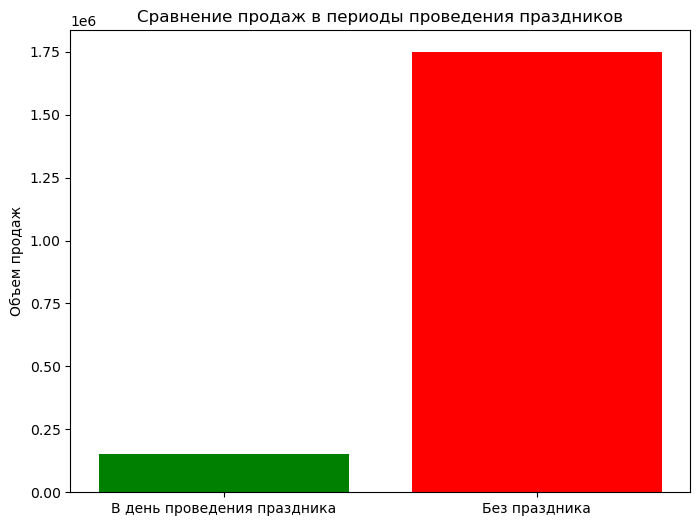

In [339]:
main_sales_comparison(data)

In [341]:
# Функция для вычисления продаж по праздникам
def sales_by_event(data):
    event_sales = data.groupby('event_name_1')['cnt'].sum().reset_index()
    event_sales = event_sales[event_sales['event_name_1'] != 'Unknown']
    
    return event_sales

In [342]:
# Функция для построения графика по праздникам
def plot_sales_by_event(event_sales):
    plt.figure(figsize=(10, 6))
    plt.bar(event_sales['event_name_1'], event_sales['cnt'], color='blue')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Объем продаж')
    plt.title('Влияние праздников на объем продаж')
    plt.show()


In [343]:
# Основной контроллер для обработки данных и построения графика
def main_sales_by_event(data):
    event_sales = sales_by_event(data)
    plot_sales_by_event(event_sales)

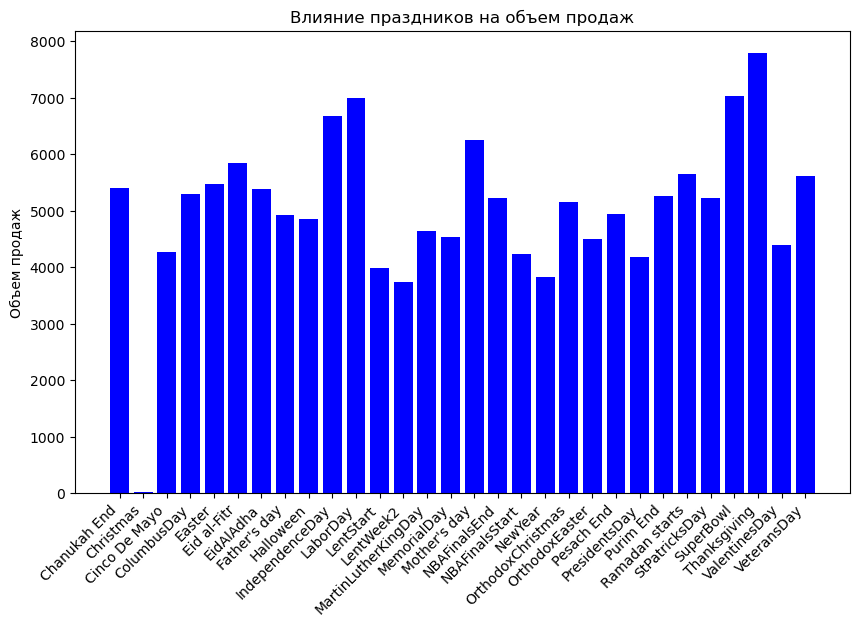

In [344]:
# Пример использования
main_sales_by_event(data)